In [4]:
!pip install pandas matplotlib

  Using cached matplotlib-3.6.3-cp38-cp38-win_amd64.whl (7.2 MB)
  Using cached pyparsing-3.0.9-py3-none-any.whl (98 kB)
  Using cached kiwisolver-1.4.4-cp38-cp38-win_amd64.whl (55 kB)
  Using cached Pillow-9.4.0-cp38-cp38-win_amd64.whl (2.5 MB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Using cached contourpy-1.0.7-cp38-cp38-win_amd64.whl (162 kB)
  Using cached fonttools-4.38.0-py3-none-any.whl (965 kB)


In [6]:
conda install -c intel scikit-learn


Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\p2112675\.conda\envs\tfsklearn

  added / updated specs:
    - scikit-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2022.10.11 |       haa95532_0         164 KB  intel
    certifi-2022.9.24          |   py38haa95532_0         158 KB  intel
    dpcpp-cpp-rt-2023.0.0      |      intel_25922         2.1 MB  intel
    dpcpp_cpp_rt-2023.0.0      |      intel_25922          20 KB  intel
    fortran_rt-2023.0.0        |      intel_25922          20 KB  intel
    icc_rt-2023.0.0            |      intel_25922          20 KB  intel
    impi_rt-2021.8.0           |      intel_25543         9.1 MB  intel
    intel-cmplr-lib-rt-2023.0.0|      intel_25922        16.1 MB  intel
    intel-cmplr-lic-rt-2023.0.0|      intel_25922          48 KB  intel
    intel-fortran-rt-2023.0.0  |    



==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 23.1.0

Please update conda by running

    $ conda update -n base -c defaults conda




In [5]:
!conda install -c plotly -y plotly



==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 23.1.0

Please update conda by running

    $ conda update -n base -c defaults conda





Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\p2112675\.conda\envs\gpuenv

  added / updated specs:
    - plotly


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    plotly-5.13.0              |             py_0         7.0 MB  plotly
    tenacity-8.0.1             |   py38haa95532_1          34 KB
    ------------------------------------------------------------
                                           Total:         7.0 MB

The following NEW packages will be INSTALLED:

  plotly             plotly/noarch::plotly-5.13.0-py_0
  tenacity           pkgs/main/win-64::tenacity-8.0.1-py38haa95532_1

The following packages will be UPDATED:

  ca-certificates                     2022.10.11-haa95532_0 --> 2023.01.10-haa95532_0
  certifi                          2022.9.24-py38haa95532_0 --> 2022.12.7-py38haa95532_0




plotly-5.13.0        | 7.0 MB  

# Generative adversarial network (GAN)
https://machinelearningmastery.com/impressive-applications-of-generative-adversarial-networks/
- GAN can generate images with high fidelity  and are used in image upsampling, image resolution and generating more image samples for normal classifiers 
- For image generation models , GANs  succeed the VAEs as they are found to create more realistic images but require longer training .
- It consist of a generator network and discriminator network that is training in a zero sum manner, where the gain of the discrminator is the loss of the generator and vice versa


## Generator 
- The generator learns to generate images that look real enough to fool the discriminator


## Discriminator 
- Learns to classfies between real images from  generated images
- Usually overfits and 'overpowers' and thus does not provide useful feedback the generator making the generator unable to learn , hence it is important to ensure balance between the 2 networks.


### CIFAR-10
- Is a common image  dataset with 50000 train and 10000 test images
- Commonly used for testing out new Architures / methods before trying them on larger dataset



In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from numpy.random import default_rng
from sklearn.manifold import TSNE
import plotly.express as px 


In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
assert x_train.shape == (50000, 32, 32, 3)
assert x_test.shape == (10000, 32, 32, 3)
assert y_train.shape == (50000, 1)
assert y_test.shape == (10000, 1)

# Data Understanding 
- This is a dataset of 50000 training images and 10,000 test images 
- Each image is 32x32x3 (LxWxH)
- Exists in both 100 classes and 20 classes of normal  day objects such as apple, bed, bicycle etc

In [3]:
label_mapping={
0:'airplane' 	,									
1:'automobile' 		,								
2:'bird' 		,								
3:'cat'		,								
4:'deer' 		,								
5:'dog' 		,								
6:'frog' 		,								
7:'horse' 		,								
8:'ship' 		,								
9:'truck',}

n_classes = 100
eday_train = np.squeeze(y_train)


### Overview of 10 classes

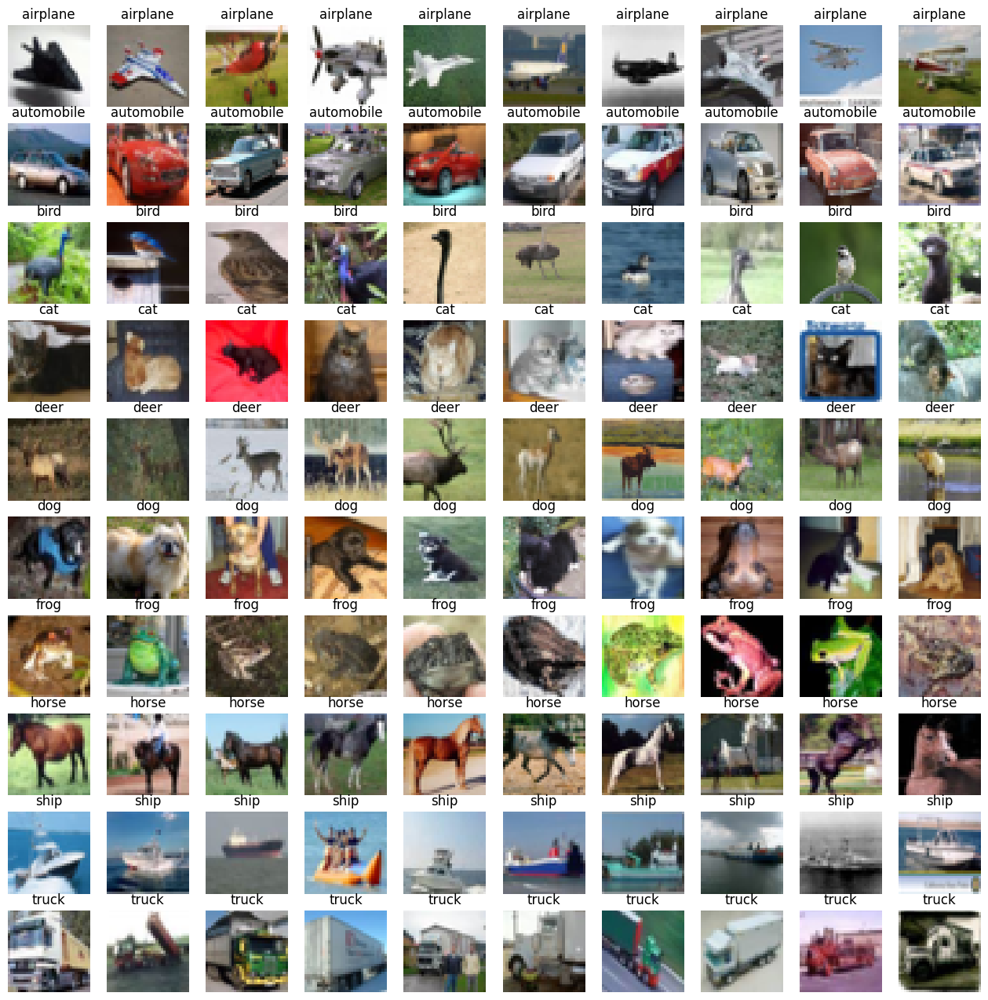

In [10]:
fig, axes = plt.subplots(10,10 , figsize = (16,16))


for i in range(10):
    for j in range(10 ):
        ax = axes[i,j]
            
        pic = x_train[eday_train == i ][j]
        ax.axis('off')
        ax.imshow(pic)
        ax.set_title(label_mapping[i])
    

plt.show()

- Generally animal images are more blurry , espescially frogs and deer and horse
- Vehicles are generally  clearer


In [4]:
tsne = TSNE(n_components=2, random_state=42, verbose = 1 , n_jobs =3 , learning_rate = 500)
num_images,height,width , channels = x_train.shape
flattened_images = x_train.reshape((num_images, height*width*channels ))
reduced = tsne.fit_transform(flattened_images  )
reduced_df = pd.DataFrame(columns=['Componenent1', 'Componenent2', 'target'],
                       data=np.column_stack((reduced, 
                                            eday_train)))


# sns.scatterplot( data =reduced_df,  x= 'Componenent1' , y = 'Componenent2' , hue = 'target' )
# eda_y_train = np.squeeze(y_train)

px.scatter(reduced_df, x='Componenent1', y='Componenent2', opacity  = 0.1,
              color='target'   , width = 900 ,height= 500 ).update_layout( margin=dict(l=20, r=10, t=10, b=0) ).show()

C:\Users\p2112675\.conda\envs\tfsklearn\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.137s...
[t-SNE] Computed neighbors for 50000 samples in 90.760s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

In [20]:
reduced_df.target=reduced_df.target.astype('int').apply(lambda x: label_mapping[x])


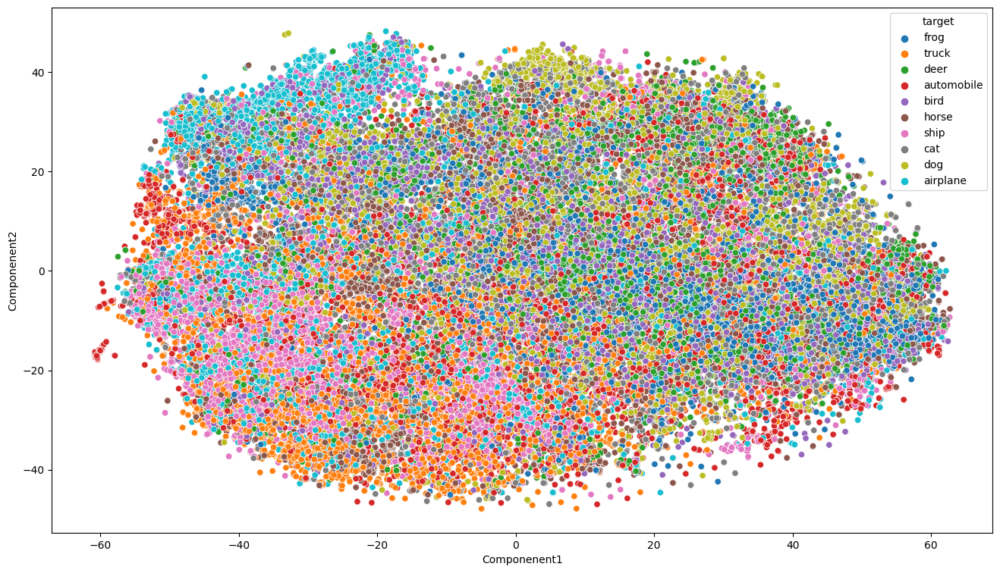

In [22]:
reduced_df
plt.figure( figsize=(16,9))
sns.scatterplot(data =reduced_df , x = 'Componenent1' , y = 'Componenent2'  , hue = 'target' , palette= sns.color_palette())
plt.show()

### TSNE 
- TSNE is a method for visualising high dimensional data using manifolds
- Images are flattend and passed into tsne 

- Air planes are well seperated from the rest of the classes occupying hte top left corner
- Frogs and cats overlap with a lot of other classes and very widely spread out accross the space
- Automobile also spread out across the space

- Truck and ship more distinct from the rest (occupying the bottom left hand corner), but overlap with each other

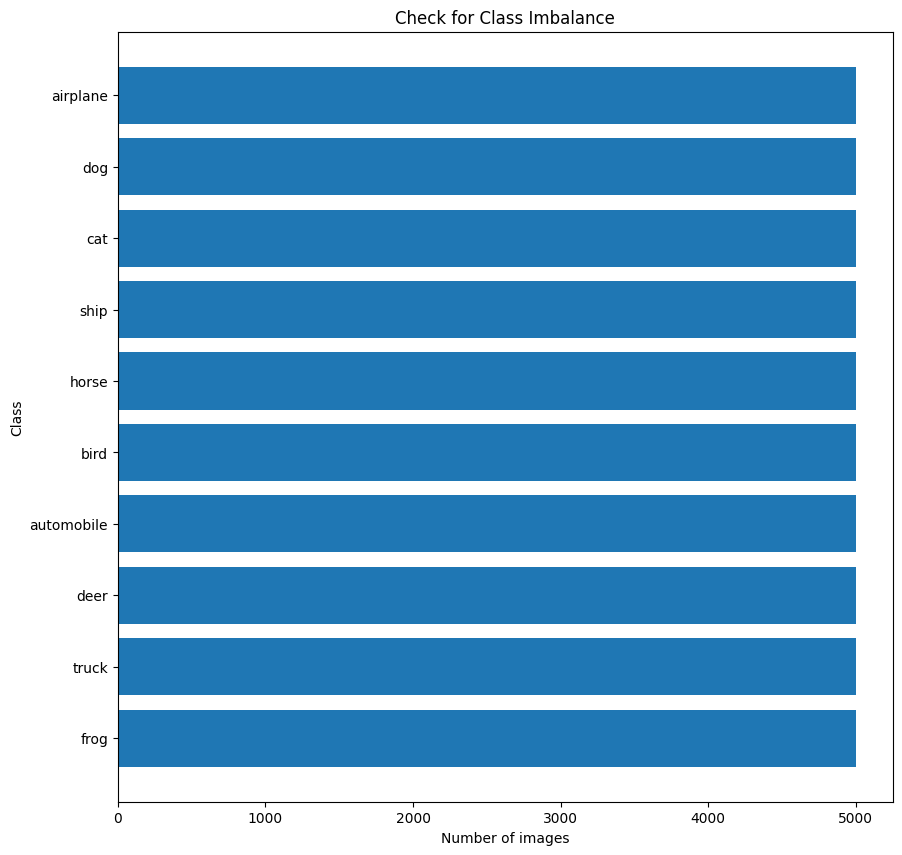

In [14]:
eda_y_train = np.squeeze(y_train)

counts = pd.Series(eda_y_train).apply(label_mapping.get).value_counts()
plt.figure(figsize = (10, 10))
plt.barh(counts.index, counts )
plt.title('Check for Class Imbalance')
plt.ylabel('Class')
plt.xlabel('Number of images')
plt.show()

- The cifar 10 dataset has 5000 images per class which is sufficient but we have to take note of the discriminator overfitting and not providing useful feedback as cifar10 is still considered a small dataset by the community


### Average image per class 
- Classes that are less similar will be more blurry  and vice versa

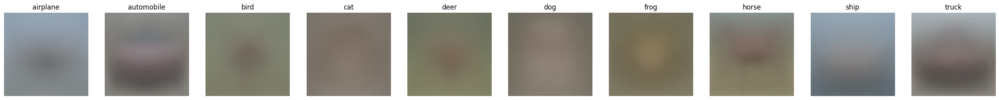

In [24]:
fig, ax = plt.subplots(1,10, figsize = ( 32,10))
for idx, a in enumerate(ax):
    img = np.mean(x_train[np.squeeze(y_train== idx)], axis =0 )/255
    a.imshow(img)
    a.set_title(label_mapping[idx])
    a.axis('off')


- The automobile  and horse looks slight more clear, showing that within the classes the images look more similar 
- Airplane, ship and truck images looks to be more in the center, which will make it easier for the gan to gererate the images there 
- Cat, dog and frog images seem to have higher variaty as it looks very blurry, cannot see even a siluolette of a these animals




In [ ]:
m = umap.UMAP(n_components=2, random_state=42)
num_images,height,width , channels = x_train.shape
flattened_images = x_train.reshape((num_images, height*width*channels ))
reduced = m.fit_transform(flattened_images  )
reduced_df = pd.DataFrame(columns=['Componenent1', 'Componenent2', 'target'],data=np.column_stack((reduced,y_train_20)))
reduced_df.target = reduced_df.target.astype('str')
# sns.scatterplot( data =reduced_df,  x= 'Componenent1' , y = 'Componenent2' , hue = 'target' )
# eda_y_train = np.squeeze(y_train)



### Modelling - Data Preprocessing (code in the notebooks that contain the  models)

> Get the pixel values by `(img -127.5)/127.5` to get the images in the range of -1 and 1 so that the scale of real images is the same as the generated images passing through the last layer of tanh from -1 to 1 .


## Metrics
### Frechet inception distance (FID)
https://arxiv.org/abs/1706.08500
- Most common metric for evaluating GAN
- The fid is a metric that compares the difference in mean and variance (of real and generated images) of the image features extracted by `InceptionV3`. 
- It is more reliable then its predecessor the Inception Score which only calculates based on the 
- As it uses both mean and variance of the features, a low FID is only achieved when the images have similar quality and diversity to the cifar10 dataset.
- It assumes a gaussian distribution
- FID can be biased for small datasets like cifar10

## Kernel inception distance (KID) 

https://arxiv.org/pdf/2206.10935.pdf#:~:text=The%20Kernel%20Inception%20Distance%20

- Measures the Maximum Mean Discrepancy between the real and generated 

- The KID improves on the FID by relaxing the gaussian requirement as it is  a non parametric test 



# To continue, Please kindly refer to the baseline notebook  on BCEGAN